In [1]:
import torch
from pytorch_pretrained_biggan import (BigGAN, one_hot_from_int, truncated_noise_sample,
                                       save_as_images, display_in_terminal)
from pytorch_pretrained_biggan.visualizer import fuse_images, adjust_pixel_range, save_image
from matplotlib import pyplot as plt
from torchvision import transforms
from tqdm import tqdm
import numpy as np

# OPTIONAL: if you want to have more information on what's happening, activate the logger as follows
# import logging
# logging.basicConfig(level=logging.INFO)


In [2]:
def merge_and_show_save(images, rows, save_name=None):
    if isinstance(images, list):
        images = np.concatenate(images, axis=0)
    images = adjust_pixel_range(images)
    if len(images.shape) == 3:
        column = 1
    else:
        column = images.shape[0] // rows
    images = fuse_images(images, row=rows)
    plt.figure(figsize = (column*5,rows*5))
    plt.imshow(images)
    if save_name is not None:
        save_image(save_name, images)

In [3]:
resnet50 = torch.hub.load('pytorch/vision:v0.10.0', 'resnet50', pretrained=True)

resnet50.eval().to('cuda')

preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

Using cache found in /home/admin/.cache/torch/hub/pytorch_vision_v0.10.0


In [4]:
# Load pre-trained model tokenizer (vocabulary)
model = BigGAN.from_pretrained('models')

In [5]:
# Prepare a input
truncation = 0.7
source = 291
target = 296
batch_size = 8

class_vector = one_hot_from_int([source]*batch_size, batch_size=batch_size)
target_class = one_hot_from_int([target]*batch_size, batch_size=batch_size)
noise_vector = truncated_noise_sample(truncation=truncation, batch_size=batch_size, seed=6602)

In [6]:
# All in tensors
noise_vector = torch.from_numpy(noise_vector)
class_vector = torch.from_numpy(class_vector)
target_class = torch.from_numpy(target_class)

# If you have a GPU, put everything on cuda
noise_vector = noise_vector.to('cuda')
class_vector = class_vector.to('cuda')
target_class = target_class.to('cuda')
_ = model.to('cuda')

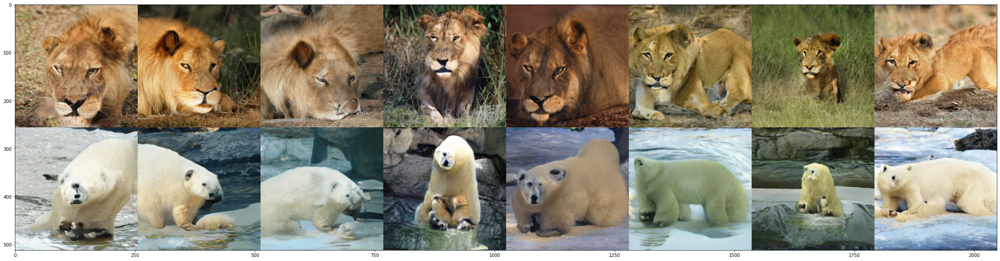

In [7]:
# Generate an image
def forward_backward(z):
    output = model(z, class_vector, truncation)
    score = resnet50(preprocess((output+1)/2))
    target_score = torch.sum(score * (target_class))
    model.zero_grad()
    target_score.backward()
    return output, target_score

def forward(z,l):
    with torch.no_grad():
        img = model(z, l, truncation)
        score = resnet50(preprocess((img+1)/2))
        target_score = torch.sum(score * target_class)
    return img, target_score

def PKD_grad(num=100, epsilon=1e-8, thre=0.999):
    grads_np_list = []
    for _ in range(num):
        z_iter = truncated_noise_sample(truncation=truncation, batch_size=batch_size)
        z_iter = torch.from_numpy(z_iter).to('cuda')
        single_list = []
        forward_backward(z_iter)
        for i, w in enumerate(model.parameters()):
            single_list.append(w.grad)
        grads_np_list.append(single_list)
    with torch.no_grad():
        grads_np_mean = []
        for i, item in enumerate(grads_np_list):
            if i == 0:
                for j, grad in enumerate(item):
                    grads_np_mean.append(grad / torch.abs(grad + epsilon))
            else:
                for j, grad in enumerate(item):
                    grads_np_mean[j] += grad / torch.abs(grad + epsilon)

        for i, grad in enumerate(grads_np_mean):
            grad_mean = grad / num
            grad_norm = 1.0 * (grad_mean > thre) - 1.0 * (grad_mean < -1*thre)
            grads_np_mean[i] = grad_norm
    return grads_np_mean

def PKD(alpha=0.001, num=100):
    grads_np_mean = PKD_grad(num)
    with torch.no_grad():
        for i, w in enumerate(model.parameters()):
            w.data = w.data + alpha*grads_np_mean[i]

# If you have a GPU put back on CPU
img_ori, score_ori = forward(noise_vector, class_vector)
img_ori = img_ori.to('cpu')
score_ori = score_ori.to('cpu')

img_tar, score_tar = forward(noise_vector, target_class)
img_tar = img_tar.to('cpu')
score_tar = score_tar.to('cpu')
# If you have a sixtel compatible terminal you can display the images in the terminal
# (see https://github.com/saitoha/libsixel for details)
merge_and_show_save([img_ori.numpy(), img_tar.numpy()],2)


100%|██████████| 2/2 [00:15<00:00,  7.81s/it]


Origin score 20.240078, target score 153.838348, now score 117.509178


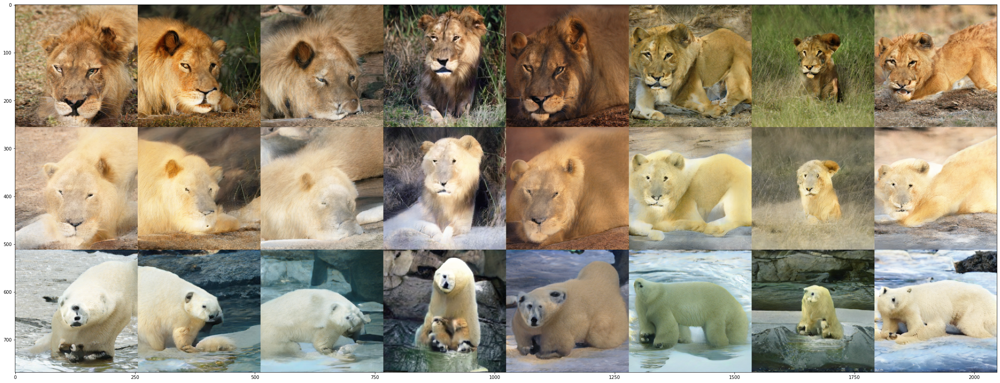

In [11]:
for _ in tqdm(range(2)):
    PKD(0.00001,32)

img, score = forward(noise_vector, class_vector)
img = img.to('cpu')
score = score.to('cpu')

print('Origin score %f, target score %f, now score %f' 
      % (score_ori.detach().numpy(), score_tar.numpy(), score.detach().numpy()))
merge_and_show_save([img_ori.numpy(), img.detach().numpy(), img_tar.numpy()],3)


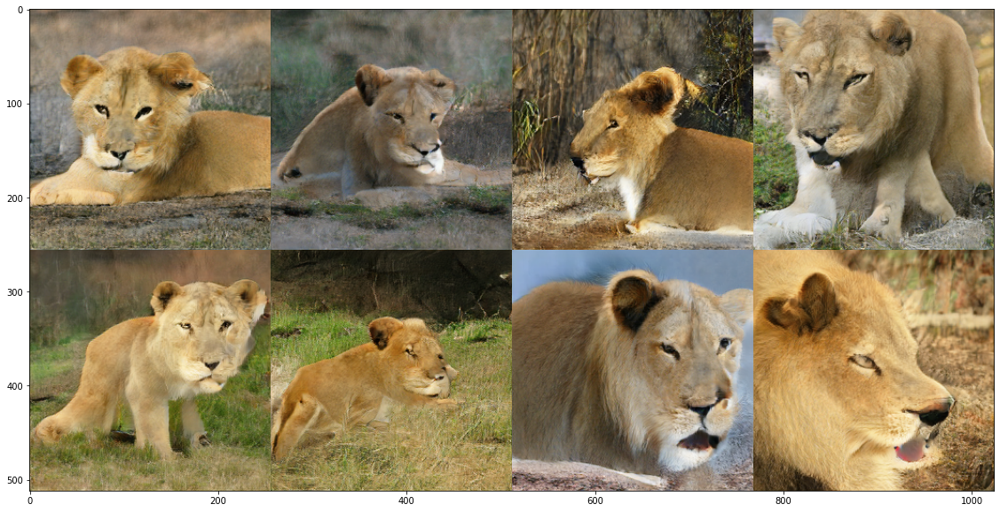

In [9]:
with torch.no_grad():
    noise_test = truncated_noise_sample(truncation=truncation, batch_size=batch_size)
    noise_test = torch.from_numpy(noise_test)
    noise_test = noise_test.to('cuda')
    img_test = model(noise_test, class_vector, truncation)
    img_test = img_test.to('cpu')
merge_and_show_save(img_test.numpy(),2)

In [19]:
def heatmap(x):
    h = np.abs(x)
    h = np.sum(x, axis=1, keepdims=True)
    h = 3*np.square(h)/ np.max(np.square(h), axis=(2,3), keepdims=True)
    return h

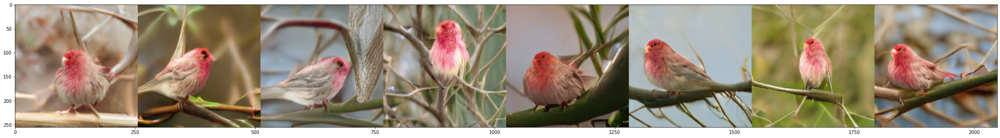

In [16]:
merge_and_show_save( img.detach().numpy(),1,'samples/dirac/338.png')

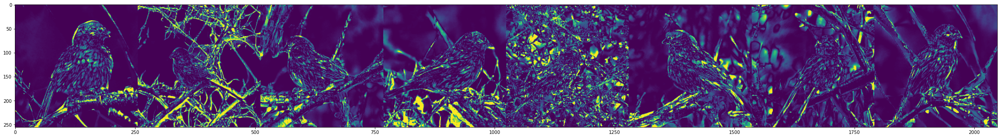

In [20]:
merge_and_show_save(heatmap(img_ori.numpy() - img.detach().numpy()),1)

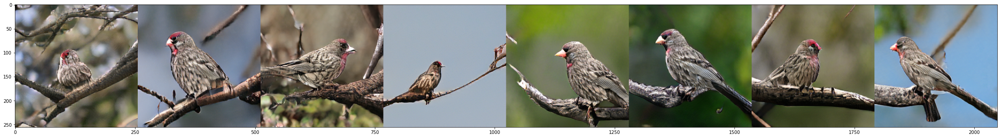

In [24]:
merge_and_show_save(img_test.detach().numpy(),1,'samples/dirac/23_sample_7.png')

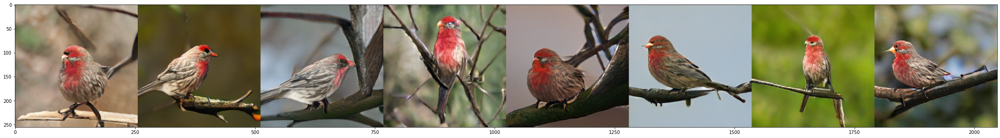

In [16]:
merge_and_show_save(img_ori.detach().numpy(),1,'samples/dirac/23_ori.png')

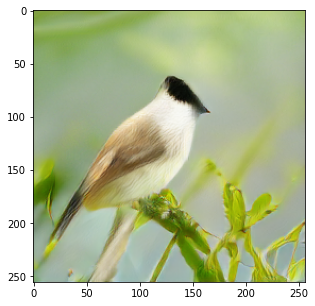

In [28]:
merge_and_show_save(img_test.detach().numpy()[7][np.newaxis,],1,'samples/polarbear_bird/mb12.png')

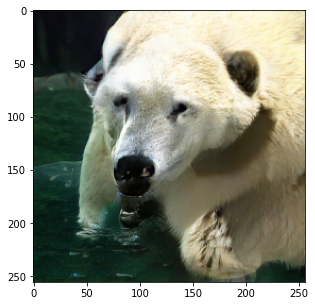

In [8]:
merge_and_show_save(img_tar.detach().numpy()[4][np.newaxis,],1,'samples/polarbear_dog/tar.png')

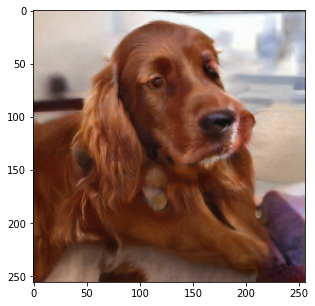

In [53]:
merge_and_show_save(img_ori.detach().numpy()[6][np.newaxis,],1,'samples/polarbear_dog/src.png')